In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
from typing import Tuple, Optional
import plotly.express as px
import plotly.graph_objects as go

In [3]:
# Get data into dataframe
df = pd.read_csv('../WMA_fractions_v2.csv', skiprows=1)

# Preprocess data to only have temperature, salinity and dissolved oxygen
df_TSO = df.copy()
df_TSO = df_TSO[['Conservative_Temperature_[deg_C]', 'Absolute_Salinity_[PSU]', 'Dissolved_Oxygen_[micro_mol_per_kg]','Depth_[m]', 'Latitude_[deg_N]', 'Longitude_[deg_E]']]
df_TSO = df_TSO.dropna()

In [4]:
def uniform_geographic_sample(
    df: pd.DataFrame,
    n_samples: int,
    lat_col: str = 'latitude',
    lon_col: str = 'longitude',
    n_grid_cells: int = 50,
    random_state: Optional[int] = None) -> pd.DataFrame:
    """
    Sample points from a dataset to minimize spatial density variability.
    
    Uses grid-based stratified sampling to ensure uniform geographic coverage.
    
    Parameters:
    -----------
    df : pd.DataFrame
        Input dataframe with geographic coordinates
    n_samples : int
        Number of samples to draw
    lat_col : str
        Name of the latitude column
    lon_col : str
        Name of the longitude column
    n_grid_cells : int
        Number of grid cells per dimension (creates n_grid_cells x n_grid_cells grid)
    random_state : int, optional
        Random seed for reproducibility
        
    Returns:
    --------
    pd.DataFrame
        Sampled dataframe with uniform spatial distribution
    """
    if random_state is not None:
        np.random.seed(random_state)
    
    df = df.copy()
    
    # Get coordinate bounds
    lat_min, lat_max = df[lat_col].min(), df[lat_col].max()
    lon_min, lon_max = df[lon_col].min(), df[lon_col].max()
    
    # Create grid cells
    lat_bins = np.linspace(lat_min, lat_max, n_grid_cells + 1)
    lon_bins = np.linspace(lon_min, lon_max, n_grid_cells + 1)
    
    # Assign each point to a grid cell
    df['_lat_bin'] = pd.cut(df[lat_col], bins=lat_bins, labels=False, include_lowest=True)
    df['_lon_bin'] = pd.cut(df[lon_col], bins=lon_bins, labels=False, include_lowest=True)
    df['_grid_cell'] = df['_lat_bin'].astype(str) + '_' + df['_lon_bin'].astype(str)
    
    # Count points per grid cell
    cell_counts = df['_grid_cell'].value_counts()
    occupied_cells = len(cell_counts)
    
    # Calculate target samples per cell for uniform distribution
    samples_per_cell = n_samples / occupied_cells
    
    # Strategy: Sample equally from each occupied cell for uniform coverage
    # First pass: try to take equal samples from each cell
    base_samples_per_cell = n_samples // occupied_cells
    extra_samples = n_samples % occupied_cells
    
    sampled_dfs = []
    cells_to_boost = []
    
    for i, cell_id in enumerate(cell_counts.index):
        cell_df = df[df['_grid_cell'] == cell_id]
        
        # Base samples for this cell
        n_from_cell = base_samples_per_cell
        
        # Distribute extra samples to first few cells
        if i < extra_samples:
            n_from_cell += 1
        
        # Can't sample more than available in cell
        n_from_cell = min(n_from_cell, len(cell_df))
        
        if n_from_cell > 0:
            sampled = cell_df.sample(n=n_from_cell, replace=False)
            sampled_dfs.append(sampled)
        
        # Track if this cell couldn't provide enough samples
        if n_from_cell < base_samples_per_cell + (1 if i < extra_samples else 0):
            deficit = (base_samples_per_cell + (1 if i < extra_samples else 0)) - n_from_cell
            cells_to_boost.append(deficit)
    
    # Combine all samples
    result = pd.concat(sampled_dfs, ignore_index=True)
    
    # If we have a deficit, sample more from cells that have remaining points
    if len(result) < n_samples:
        remaining_df = df[~df.index.isin(result.index)]
        if len(remaining_df) > 0:
            additional_needed = n_samples - len(result)
            additional = remaining_df.sample(n=min(additional_needed, len(remaining_df)), replace=False)
            result = pd.concat([result, additional], ignore_index=True)
    
    # Remove helper columns
    result = result.drop(columns=['_lat_bin', '_lon_bin', '_grid_cell'])
    
    return result

In [5]:
df_sampled = uniform_geographic_sample(df_TSO, n_samples=100000, lat_col='Latitude_[deg_N]', lon_col='Longitude_[deg_E]', n_grid_cells=100, random_state=22)

In [6]:
# Extract values into a tensor
X = torch.tensor(df_sampled.values, dtype=torch.float32)
dataset = TensorDataset(X)
loader = DataLoader(dataset, batch_size=64, shuffle=True)

In [7]:
# Define Variational Autoencoder

class VAE(nn.Module):
    def __init__(self, input_dim=3, latent_dim=2):
        super().__init__()

        # Encoder
        self.fc1 = nn.Linear(input_dim, 16)
        self.fc_mu = nn.Linear(16, latent_dim)
        self.fc_logvar = nn.Linear(16, latent_dim)

        # Decoder
        self.fc2 = nn.Linear(latent_dim, 16)
        self.fc3 = nn.Linear(16, input_dim)

    def encode(self, x):
        h = F.relu(self.fc1(x))
        return self.fc_mu(h), self.fc_logvar(h)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        h = F.relu(self.fc2(z))
        return self.fc3(h)     # no sigmoid for real-valued data

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

In [8]:
# Define loss function (mse and KL divergence)
def vae_loss(recon_x, x, mu, logvar):
    mse = F.mse_loss(recon_x, x, reduction='sum')
    kld = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())
    return mse + kld

In [9]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model = VAE(input_dim=6, latent_dim=2).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

epochs = 50

for epoch in range(epochs):
    model.train()
    total_loss = 0
    
    for batch in loader:
        x = batch[0].to(device)
        optimizer.zero_grad()

        recon, mu, logvar = model(x)
        loss = vae_loss(recon, x, mu, logvar)

        loss.backward()
        total_loss += loss.item()
        optimizer.step()

    print(f"Epoch {epoch+1} | Loss: {total_loss / len(dataset):.4f}")

Epoch 1 | Loss: 41564.2592
Epoch 2 | Loss: 11650.3475
Epoch 3 | Loss: 8337.4516
Epoch 4 | Loss: 7384.3416
Epoch 5 | Loss: 6715.1729
Epoch 6 | Loss: 5920.5212
Epoch 7 | Loss: 4949.6195
Epoch 8 | Loss: 4074.1700
Epoch 9 | Loss: 3083.4986
Epoch 10 | Loss: 1932.7107
Epoch 11 | Loss: 1215.8583
Epoch 12 | Loss: 989.1796
Epoch 13 | Loss: 887.4676
Epoch 14 | Loss: 828.9981
Epoch 15 | Loss: 794.4719
Epoch 16 | Loss: 743.4518
Epoch 17 | Loss: 714.0695
Epoch 18 | Loss: 698.3659
Epoch 19 | Loss: 681.7608
Epoch 20 | Loss: 661.5580
Epoch 21 | Loss: 651.5732
Epoch 22 | Loss: 638.3029
Epoch 23 | Loss: 625.9296
Epoch 24 | Loss: 609.8987
Epoch 25 | Loss: 587.0442
Epoch 26 | Loss: 570.3251
Epoch 27 | Loss: 556.1981
Epoch 28 | Loss: 546.4478
Epoch 29 | Loss: 536.6440
Epoch 30 | Loss: 533.1726
Epoch 31 | Loss: 526.2248
Epoch 32 | Loss: 519.4456
Epoch 33 | Loss: 516.4002
Epoch 34 | Loss: 515.2431
Epoch 35 | Loss: 507.6894
Epoch 36 | Loss: 506.0677
Epoch 37 | Loss: 505.8353
Epoch 38 | Loss: 498.2230
Epoch 39

In [10]:
model.eval()
with torch.no_grad():
    mu, logvar = model.encode(X.to(device))
    z = mu.cpu()   # latent representation

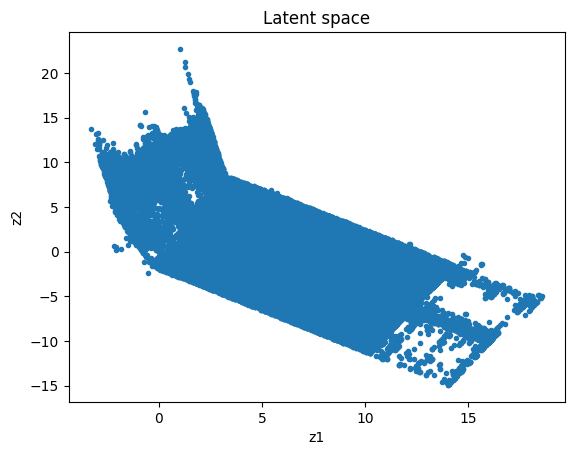

In [11]:
plt.scatter(z[:,0].cpu().tolist(), z[:,1].cpu().tolist(), marker='.')
plt.xlabel("z1")
plt.ylabel("z2")
plt.title("Latent space")
plt.show()

from Medium
## AIC
AIC (Akaike Information Criterion) rewards models that fit the data well while penalizing unnecessary complexity. AIC is more forgiving, often favoring slightly more complex models. It’s commonly used when we want to avoid underfitting, and is preferred for smaller datasets.

$AIC = -2 \ln(\text{Likelihood}) + 2k$

## BIC
BIC (Bayesian Information Criterion) also penalizes complexity but is stricter, especially for large datasets. BIC is stricter, especially as the dataset grows. It tends to favor simpler models, as the penalty for extra parameters increases with sample size.
    
$BIC = -2 \ln(\text{Likelihood}) + k \ln(n)$

https://medium.com/@jshaik2452/choosing-the-best-model-a-friendly-guide-to-aic-and-bic-af220b33255f

Choice of scores also from https://hmmlearn.readthedocs.io/en/latest/auto_examples/plot_gaussian_model_selection.html

## Log Likelihood

Used in Maximum Likelihood Estimation (Goodness of fit test)

https://medium.com/@gopal.sukumar/aic-bic-penalties-and-the-science-behind-model-selection-bd0d4d06d335

In [12]:
from sklearn.mixture import GaussianMixture 
# Do BIC and AIC calculation for different number of clusters
bic_scores = []
aic_scores = []
ll_scores = []
n_components_range = range(1, 12)
for n_components in n_components_range:
    gmm = GaussianMixture(n_components=n_components, covariance_type='full', random_state=22)
    gmm.fit(z.cpu().numpy())
    bic_scores.append(gmm.bic(z.cpu().numpy()))
    aic_scores.append(gmm.aic(z.cpu().numpy()))
    ll_scores.append(gmm.score(z.cpu().numpy()))

/Users/franciscagomes/PhD/WM_class/.venv/lib/python3.12/site-packages/threadpoolctl.py:1226: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)


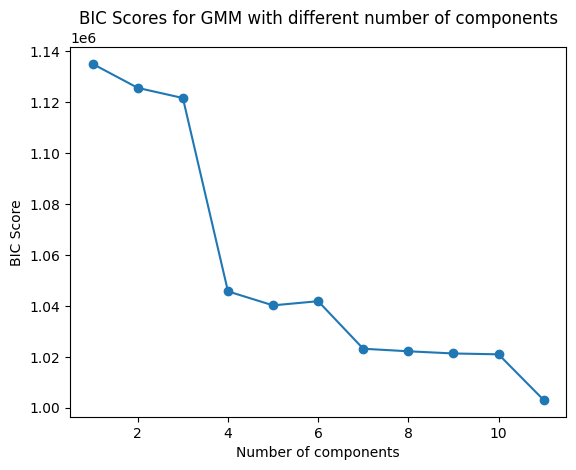

In [13]:
# BIC score plot
plt.plot(n_components_range, bic_scores, marker='o')
plt.xlabel("Number of components")  
plt.ylabel("BIC Score")
plt.title("BIC Scores for GMM with different number of components")
plt.show()

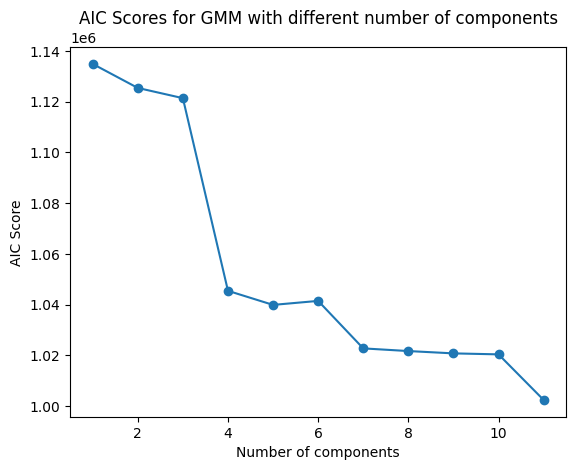

In [14]:
# AIC score plot
plt.plot(n_components_range, aic_scores, marker='o')
plt.xlabel("Number of components")
plt.ylabel("AIC Score")
plt.title("AIC Scores for GMM with different number of components")
plt.show()

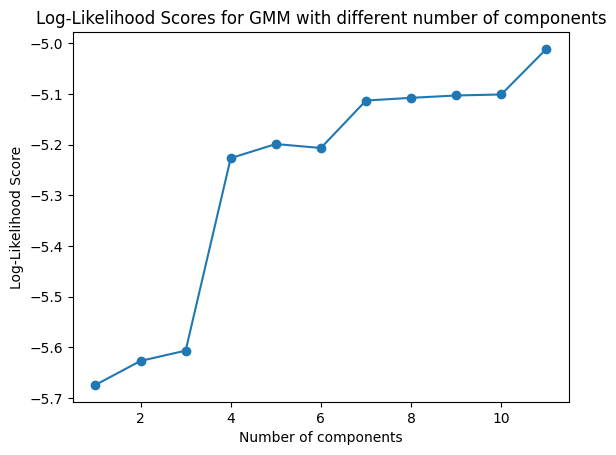

In [15]:
# Log-Likelihood score plot
plt.plot(n_components_range, ll_scores, marker='o')
plt.xlabel("Number of components")
plt.ylabel("Log-Likelihood Score")
plt.title("Log-Likelihood Scores for GMM with different number of components")
plt.show()

In [16]:
with torch.no_grad():
    recon = model(X.to(device))[0].cpu().numpy()

In [17]:
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=4, random_state=22)
gmm.fit(z)
gmm_labels = gmm.predict(z)
df_sampled['gmm_label'] = gmm_labels.astype(int)

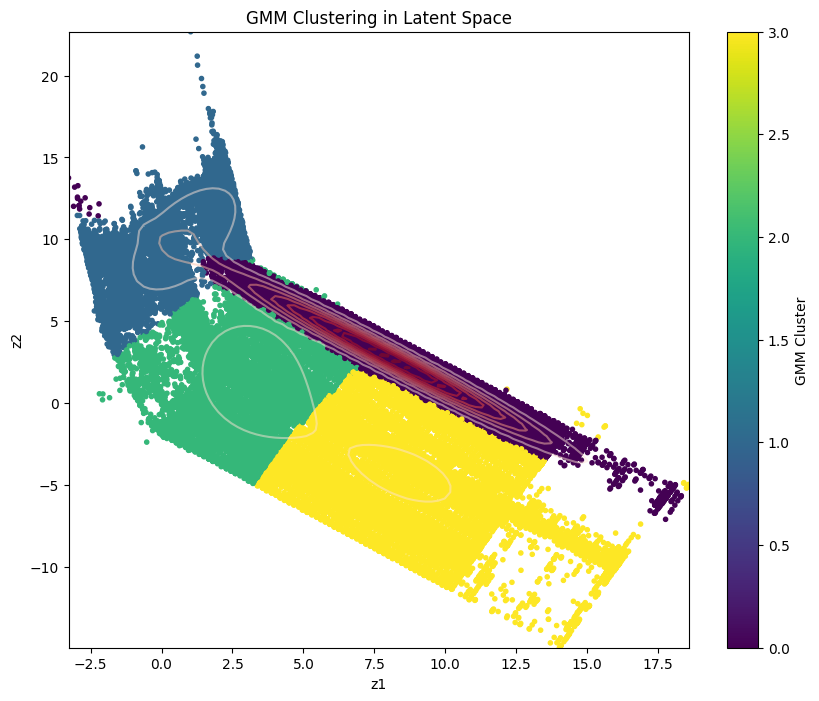

In [18]:
# Plot GMM on latent space with probability contours for each cluster
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111)
scatter = ax.scatter(z[:,0].cpu().tolist(), z[:,1].cpu().tolist(), c=gmm_labels, cmap='viridis', marker='.')
plt.xlabel("z1")
plt.ylabel("z2")
plt.title("GMM Clustering in Latent Space")
plt.colorbar(scatter, label='GMM Cluster')
# Plot contours
x = np.linspace(z[:,0].min().cpu(), z[:,0].max().cpu(), 100)
y = np.linspace(z[:,1].min().cpu(), z[:,1].max().cpu(), 100)
X_grid, Y_grid = np.meshgrid(x, y)
pos = np.dstack((X_grid, Y_grid))
Z = np.exp(gmm.score_samples(pos.reshape(-1, 2))).reshape(X_grid.shape)
ax.contour(X_grid, Y_grid, Z, levels=10, cmap='Reds', alpha=0.5)
plt.show()


In [19]:
# Compute data centroid (mean location)
center_lat = df_sampled['Latitude_[deg_N]'].mean()
center_lon = df_sampled['Longitude_[deg_E]'].mean()

print("Center lat:", center_lat, "Center lon:", center_lon)

# Use labels from kmeans clustering on data to plot geographically
fig3 = px.scatter_geo(
    df_sampled,
    lat='Latitude_[deg_N]',
    lon='Longitude_[deg_E]',
    color='gmm_label',
    title="Gaussian Mixture Model on VAE latent space projected on geographic map"
)

fig3.update_geos(
    projection_type="orthographic",
    projection_rotation=dict(lat=center_lat, lon=center_lon),
    showcoastlines=True,
    showcountries=True
)

fig3.update_layout(height=800, width=800)
fig3.show()

Center lat: 79.81604592 Center lon: -50.949791180000005


In [20]:
# Plot in depth at different latitudes
fig4 = go.Figure()
for label in df_sampled['gmm_label'].unique():
    df_subset = df_sampled[df_sampled['gmm_label'] == label]
    fig4.add_trace(go.Scatter3d(
        x=df_subset['Longitude_[deg_E]'],
        y=df_subset['Latitude_[deg_N]'],
        z=df_subset['Depth_[m]'],
        mode='markers',
        marker=dict(size=2),
        name=f'Cluster {label}'
    ))
fig4.update_layout(
    scene=dict(
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        zaxis_title='Depth (m)',
        zaxis=dict(autorange='reversed')  # Depth increases downwards
    ),
    title="3D Scatter plot of GMM clusters in geographic space"
)
fig4.show()

In [21]:
# Temperature salunity diagram colored by GMM labels
fig5 = px.scatter(
    df_sampled,
    x='Absolute_Salinity_[PSU]',
    y='Conservative_Temperature_[deg_C]',
    color='gmm_label',
    title="Temperature-Salinity Diagram colored by GMM clusters"
)
fig5.update_layout(height=600, width=800)
fig5.show()

# 6 Classes

In [22]:
gmm6 = GaussianMixture(n_components=6, random_state=22)
gmm6.fit(z)
gmm6_labels = gmm6.predict(z)
df_sampled['gmm_label_6'] = gmm6_labels.astype(int)

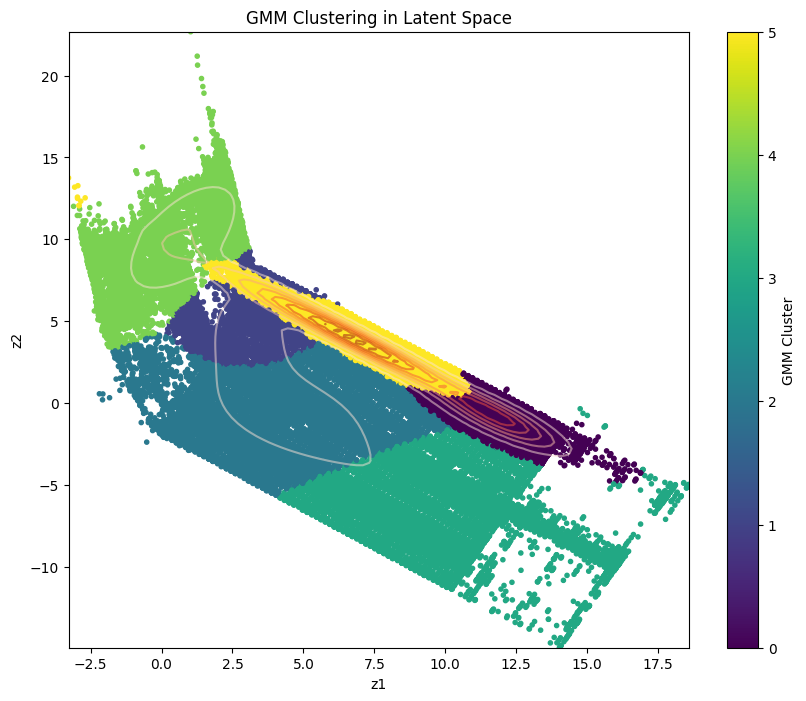

In [23]:
# Plot GMM on latent space with probability contours for each cluster
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111)
scatter = ax.scatter(z[:,0].cpu().tolist(), z[:,1].cpu().tolist(), c=gmm6_labels, cmap='viridis', marker='.')
plt.xlabel("z1")
plt.ylabel("z2")
plt.title("GMM Clustering in Latent Space")
plt.colorbar(scatter, label='GMM Cluster')

# Plot contours
x = np.linspace(z[:,0].min().cpu(), z[:,0].max().cpu(), 100)
y = np.linspace(z[:,1].min().cpu(), z[:,1].max().cpu(), 100)
X_grid, Y_grid = np.meshgrid(x, y)
pos = np.dstack((X_grid, Y_grid))
Z = np.exp(gmm6.score_samples(pos.reshape(-1, 2))).reshape(X_grid.shape)
ax.contour(X_grid, Y_grid, Z, levels=10, cmap='Reds', alpha=0.5)
plt.show()


In [24]:
# Compute data centroid (mean location)
center_lat = df_sampled['Latitude_[deg_N]'].mean()
center_lon = df_sampled['Longitude_[deg_E]'].mean()

print("Center lat:", center_lat, "Center lon:", center_lon)

# Use labels from kmeans clustering on data to plot geographically
fig3 = px.scatter_geo(
    df_sampled,
    lat='Latitude_[deg_N]',
    lon='Longitude_[deg_E]',
    color='gmm_label_6',
    title="Gaussian Mixture Model on VAE latent space projected on geographic map"
)

fig3.update_geos(
    projection_type="orthographic",
    projection_rotation=dict(lat=center_lat, lon=center_lon),
    showcoastlines=True,
    showcountries=True
)

fig3.update_layout(height=800, width=800)
fig3.show()

Center lat: 79.81604592 Center lon: -50.949791180000005


In [27]:
# Plot in depth at different latitudes
fig4 = go.Figure()
for label in df_sampled['gmm_label_6'].unique():
    df_subset = df_sampled[df_sampled['gmm_label_6'] == label]
    fig4.add_trace(go.Scatter3d(
        x=df_subset['Longitude_[deg_E]'],
        y=df_subset['Latitude_[deg_N]'],
        z=df_subset['Depth_[m]'],
        mode='markers',
        marker=dict(size=2),
        name=f'Cluster {label}'
    ))
fig4.update_layout(
    scene=dict(
        xaxis_title='Longitude',
        yaxis_title='Latitude',
        zaxis_title='Depth (m)',
        zaxis=dict(autorange='reversed')  # Depth increases downwards
    ),
    title="3D Scatter plot of GMM clusters in geographic space"
)
fig4.show()

In [26]:
# Temperature salunity diagram colored by GMM labels
fig5 = px.scatter(
    df_sampled,
    x='Absolute_Salinity_[PSU]',
    y='Conservative_Temperature_[deg_C]',
    color='gmm_label_6',
    title="Temperature-Salinity Diagram colored by GMM clusters"
)
fig5.update_layout(height=600, width=800)
fig5.show()